In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [2]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score  

In [3]:
fake= pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')

In [4]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [5]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [6]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

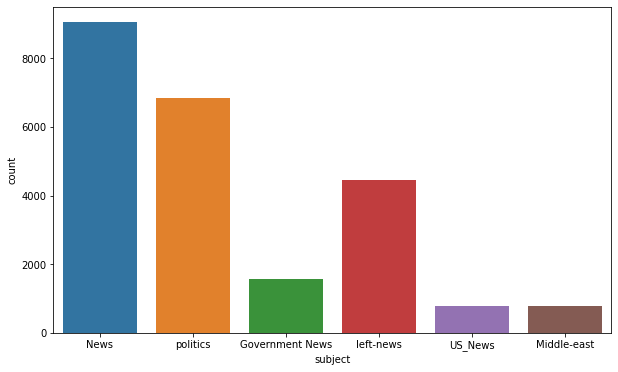

In [7]:
plt.figure(figsize = (10, 6))
sns.countplot(x = 'subject', data=fake)

WordCLoud

In [8]:
text = ''.join(fake['text'].tolist())

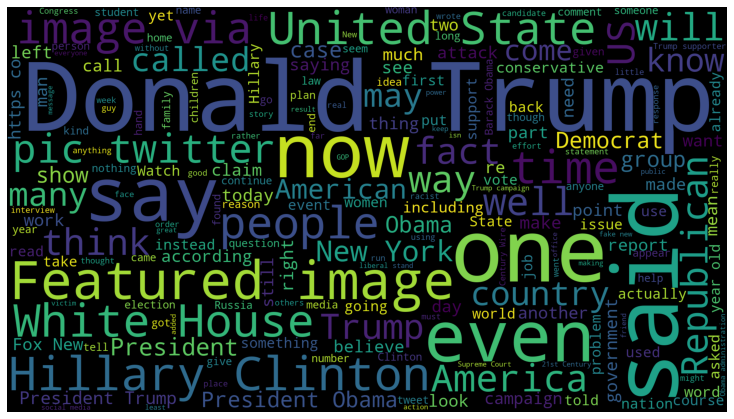

In [9]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Exploring Real News

In [10]:
real = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')

In [11]:
text = ''.join(real['text'].tolist())

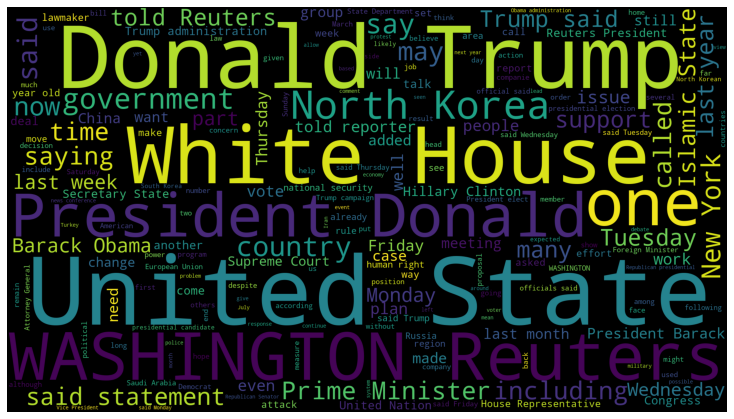

In [12]:
wordcloud = WordCloud(width=1920, height=1080).generate(text)
fig = plt.figure(figsize=(10,10))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

Cleaning Data

In [13]:
real.sample(5)

,title,text,subject,date
12339,"Moscow, Cairo may sign deal on Friday to resum...",MOSCOW (Reuters) - Russia and Egypt may sign a...,worldnews,"December 14, 2017"
964,Manafort attorney: No evidence client colluded...,WASHINGTON (Reuters) - The attorney for former...,politicsNews,"October 30, 2017"
3556,Civil rights group sues in U.S. court over imm...,(Reuters) - The American Civil Liberties Union...,politicsNews,"May 25, 2017"
9252,Trump says his comments on Mexican-American ju...,WASHINGTON (Reuters) - Presumptive Republican ...,politicsNews,"June 7, 2016"
4425,Factbox: Trump adviser from Wall Street backs ...,WASHINGTON (Reuters) - Former Goldman Sachs Gr...,politicsNews,"April 6, 2017"


In [14]:
unknown_publishers = []
for index, row in enumerate(real.text.values):
  try:
    record = row.split('-', maxsplit = 1)
    record[1]

    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [15]:
len(unknown_publishers)

222

In [16]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [17]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [18]:
real = real.drop(8970, axis=0)

In [19]:
publisher = []
tmp_text = []
for index, row in enumerate(real.text.values):
  if index in unknown_publishers:
    tmp_text.append(row)
    publisher.append('Unknown')
  
  else:
    record = row.split('-', maxsplit = 1)
    publisher.append(record[0].strip())
    tmp_text.append(record[1].strip())

In [20]:
real['publisher'] = publisher
real['text'] = tmp_text

In [21]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [22]:
empty_fake_index = [index for index, text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [23]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [24]:
real['text'] = real['title'] + " " + real['text']
fake['text'] = fake['title'] + " " + fake['text']

In [25]:
real['text'] = real['text'].apply(lambda x: str(x).lower())
fake['text'] = fake['text'].apply(lambda x: str(x).lower())

Preprocessing text

In [26]:
real['class'] = 1
fake['class'] = 0

In [27]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [28]:
real = real[['text', 'class']]  

In [29]:
fake = fake[['text', 'class']]

In [30]:
data = real.append(fake, ignore_index = True)

In [31]:
data.sample(5)

,text,class
14165,norway's police downgrade threat level norwegi...,1
5604,"netanyahu, trump align on iran ahead of israel...",1
7493,colorado judge rejects request to extend votin...,1
22876,second congressman calls for trump’s impeachm...,0
348,u.s. defense chief urges pakistan to redouble ...,1


In [32]:
# https://github.com/laxmimerit/preprocess_kgptalkie

In [33]:
!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 10.4 MB 7.2 MB/s 
     |████████████████████████████████| 2.2 MB 59.0 MB/s 
  Attempting uninstall: thinc
    Found existing installation: thinc 7.4.0
    Uninstalling thinc-7.4.0:
      Successfully uninstalled thinc-7.4.0
  Attempting uninstall: spacy
    Found existing installation: spacy 2.2.4
    Uninstalling spacy-2.2.4:
      Successfully uninstalled spacy-2.2.4
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 12.0 MB 9.3 MB/s 
✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 115 kB 8.8 MB/s 
  Attempting uninstall: beautifulsoup4
    Found existing installation: beaut

In [34]:
import preprocess_kgptalkie as ps

In [35]:
data['text'] = data['text'].apply(lambda x: ps.remove_special_chars(x))

In [36]:
ps.remove_special_chars('this ,. @ # is')

'this is'

In [37]:
data.head()

,text,class
0,as us budget fight looms republicans flip thei...,1
1,us military to accept transgender recruits on ...,1
2,senior us republican senator let mr mueller do...,1
3,fbi russia probe helped by australian diplomat...,1
4,trump wants postal service to charge much more...,1


Vectorization

In [38]:
import gensim

In [39]:
y = data['class'].values

In [40]:
X = [d.split() for d in data['text'].tolist()]

In [41]:
type(X[0])

list

In [42]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues',

In [43]:
DIM = 100
w2v_model = gensim.models.Word2Vec(sentences=X, size=DIM, window=10, min_count=1 )

In [44]:
len(w2v_model.wv.vocab)

231872

In [45]:
w2v_model.wv['love']

array([ 0.3532019 ,  1.6087633 ,  2.422133  , -0.07503057,  3.288691  ,
       -0.47637913,  0.63207364,  4.9532666 , -4.6600046 , -2.9453604 ,
        1.3108842 ,  3.966675  , -0.64246786, -2.4524531 ,  1.7974045 ,
       -0.9109078 , -0.43458357, -0.7761409 , -6.29417   ,  1.4127038 ,
       -1.2588458 , -2.4161391 ,  0.04839192, -3.177476  , -0.5011504 ,
        1.8081685 ,  1.735535  , -1.5683556 , -0.13250256, -2.0735147 ,
        3.535128  ,  3.63777   , -2.7045422 ,  2.7924063 ,  1.3182654 ,
       -1.5496979 , -3.7720702 ,  0.51473653,  1.1346344 , -2.7369952 ,
        0.11275873,  3.9875708 ,  2.4975932 ,  1.329     , -0.53876364,
       -2.2795773 , -2.9155262 , -1.6314031 ,  0.65899426,  0.23488475,
        0.39289346, -0.4861831 , -0.16032733,  5.873228  ,  1.0877378 ,
       -1.8831903 , -0.5362046 , -0.25994492,  0.39570284,  0.13108085,
       -0.43528232, -1.9773775 ,  3.318038  , -1.0678843 , -2.0156865 ,
       -0.6503695 , -0.23501909, -3.05121   , -0.5633061 , -3.13

In [46]:
w2v_model.wv.most_similar('china')

[('beijing', 0.8512096405029297),
 ('taiwan', 0.7924095392227173),
 ('chinas', 0.7787413001060486),
 ('chinese', 0.7093709707260132),
 ('pyongyang', 0.6753175258636475),
 ('beijings', 0.672493577003479),
 ('india', 0.6519721746444702),
 ('japan', 0.6505850553512573),
 ('xi', 0.6466916799545288),
 ('vietnam', 0.5843886137008667)]

In [47]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(X)

In [48]:
X = tokenizer.texts_to_sequences(X)

In [49]:
X

[[18,
  30,
  473,
  480,
  10668,
  133,
  8088,
  40,
  1375,
  5171,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  393,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7895,
  141,
  164,
  320,
  133,
  30,
  798,
  922,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8089,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

In [50]:
#tokenizer.word_index

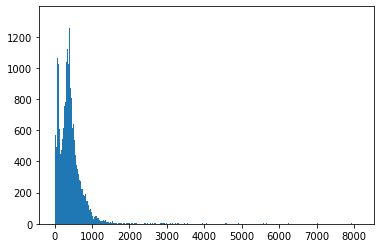

In [51]:
plt.hist([len(x) for x in X], bins = 700)
plt.show()

In [52]:
nos = np.array([len(x) for x in X])
len(nos[nos>1000])

1581

In [53]:
maxlen = 1000
X = pad_sequences(X, maxlen=maxlen)

In [54]:
len(X[100])

1000

In [55]:
vocab_size = len(tokenizer.word_index) + 1
vocab = tokenizer.word_index

In [56]:
def get_weight_matrix(model):
  weight_matrix = np.zeros((vocab_size, DIM))

  for word, i in vocab.items():
    weight_matrix[i] = model.wv[word]

  return weight_matrix

In [57]:
embedding_vectors = get_weight_matrix(w2v_model)

In [58]:
embedding_vectors.shape

(231873, 100)

In [59]:
model = Sequential()
model.add(Embedding(vocab_size, output_dim = DIM, weights = [embedding_vectors], input_length = maxlen, trainable = False))
model.add(LSTM(units = 128))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer = 'adam' , loss='binary_crossentropy', metrics=['acc'])

In [60]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23187300  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,304,677
Trainable params: 117,377
Non-trainable params: 23,187,300
_________________________________________________________________


In [63]:
X_train, X_test, y_train, y_test = train_test_split(X,y)

In [64]:
model.fit(X_train, y_train, validation_split = 0.3, epochs = 6)

Epoch 1/6
737/737 [==============================] - 49s 66ms/step - loss: 0.1365 - acc: 0.9507 - val_loss: 0.1516 - val_acc: 0.9405
Epoch 2/6
737/737 [==============================] - 42s 57ms/step - loss: 0.0532 - acc: 0.9821 - val_loss: 0.0786 - val_acc: 0.9706
Epoch 3/6
737/737 [==============================] - 41s 56ms/step - loss: 0.0571 - acc: 0.9797 - val_loss: 0.0434 - val_acc: 0.9859
Epoch 4/6
737/737 [==============================] - 50s 68ms/step - loss: 0.0348 - acc: 0.9880 - val_loss: 0.0367 - val_acc: 0.9882
Epoch 5/6
737/737 [==============================] - 40s 55ms/step - loss: 0.0232 - acc: 0.9927 - val_loss: 0.0288 - val_acc: 0.9898
Epoch 6/6
737/737 [==============================] - 41s 56ms/step - loss: 0.0157 - acc: 0.9947 - val_loss: 0.1035 - val_acc: 0.9618


In [66]:
y_pred = (model.predict(X_test) >= 0.5).astype(int)

In [67]:
accuracy_score(y_test, y_pred)

0.964097995545657

In [68]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       1.00      0.93      0.96      5869
           1       0.93      1.00      0.96      5356

    accuracy                           0.96     11225
   macro avg       0.96      0.97      0.96     11225
weighted avg       0.97      0.96      0.96     11225



In [69]:
x = ['this is  a news']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x , maxlen = maxlen)

In [71]:
model.predict(x)

array([[0.4428628]], dtype=float32)

In [72]:
(model.predict(x) >= 0.5).astype(int)

array([[0]])

In [73]:
x = ['The coronavirus mutant that is now dominant in the United States is a member of the omicron family but scientists say it spreads faster than its omicron predecessors, is adept at escaping immunity and might possibly cause more serious disease. Why? Because it combines properties of both omicron and delta, the nation’s dominant variant in the middle of last year. A genetic trait that harkens back to the pandemic’s past, known as a “delta mutation,” appears to allow the virus “to escape pre-existing immunity from vaccination and prior infection, especially if you were infected in the omicron wave,” said Dr. Wesley Long, a pathologist at Houston Methodist in Texas. That’s because the original omicron strain that swept the world didn’t have the mutation. The omicron “subvariant” gaining ground in the U.S. — known as BA.2.12.1 and responsible for 58% of U.S. COVID-19 cases last week — isn’t the only one affected by the delta mutation. The genetic change is also present in the omicron relatives that together dominate in South Africa, known as BA.4 and BA.5. Those have exactly the same mutation as delta, while BA.2.12.1 has one that’s nearly identical. This genetic change is bad news for people who caught the original omicron and thought that made them unlikely to get COVID-19 again soon. Although most people don’t know for sure which variant caused their illness, the original omicron caused a giant wave of cases late last year and early this year.']
x = tokenizer.texts_to_sequences(x)
x = pad_sequences(x , maxlen = maxlen)
(model.predict(x) >= 0.5).astype(int)

array([[1]])